# Mapping with Geopandas

In [10]:
import folium

m = folium.Map(location=(45.5236, -122.6750))
m

Mapping is a GIS specialization unto itself, and no single reading can do justice to the many nuances of the field. But thanks to the modularity of Python and geopandas, even this short reading should equip you to create some relatively powerful static and even interactive plots. 


## Static Maps with matplotlib

As we saw in our previous readings, the `.plot()` command is an easy way to create maps in geopandas. Just calling `.plot()` results in geopandas visualizing our data in a relatively nice way:

In [25]:
import geopandas as gpd

world = gpd.read_file(
    "https://github.com/nickeubank/practicaldatascience_book/"
    "raw/refs/heads/main/notebooks/"
    "gis/example_data/world_countries/world_countries.geojson"
)

# Plot!
world.explore()

In [22]:
world.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [19]:
cities = gpd.read_file(
    "https://github.com/nickeubank/practicaldatascience_book/raw"
    "/refs/heads/main/notebooks/gis/example_data/world_cities/world_cities_robinson.geojson"
)
cities.explore()

But the real power of this method of mapping is that geopandas is using matplotlib to create these figures.


<Axes: title={'center': 'The World'}>

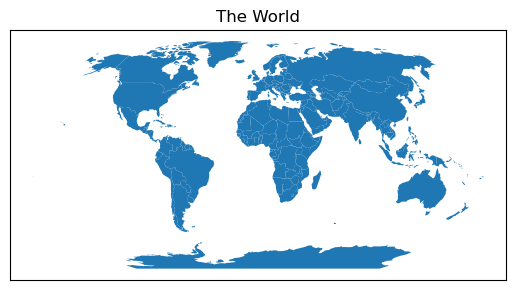

In [2]:
ax = world.plot()
ax.set_title("The World")
ax.set_xticks([])
ax.set_yticks([])
ax

Moreover if you pass `.plot()` a column name, geopandas will color locations on the map based on the value of that variable, creating a [choropleth map](https://en.wikipedia.org/wiki/Choropleth_map):

<Axes: title={'center': 'World GDP Per Capita'}>

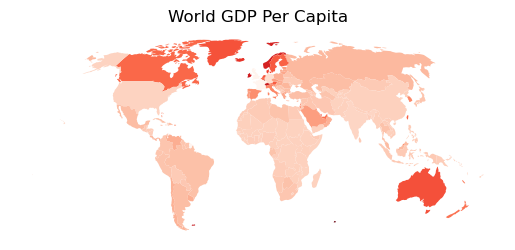

In [3]:
world["gdp_per_cap"] = (world["gdp_md"] * 1_000) / world["pop_est"]
world = world[world["name"] != "Antarctica"].copy()
ax = world.plot("gdp_per_cap", cmap="Reds")
ax.set_title("World GDP Per Capita")
ax.set_axis_off()
ax

### More Granularity with matplotlib

For even more granular control, you can have geopandas plot directly onto a subplot with the `ax` keyword:

<Axes: title={'center': 'World GDP Per Capita'}>

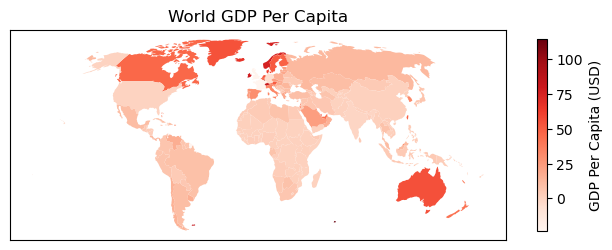

In [4]:
import matplotlib.pyplot as plt

# Create a subplot figure and axes object.
# Here I want one that's relatively wide
# to improve colorbar fit.
fig, ax = plt.subplots(figsize=(8, 5))

# use `ax=ax` to have geopandas plot onto the
# created axes
world.plot("gdp_per_cap", ax=ax, cmap="Reds")
ax.set_title("World GDP Per Capita")
ax.set_xticks([])
ax.set_yticks([])

# Now I can also work with colormaps in more detail
cbar = fig.colorbar(ax.collections[0], ax=ax, shrink=0.5)
cbar.set_label("GDP Per Capita (USD)")

ax

## Overlaying Data

This same trick can also be used to overlay different datasets. Below, I get data on cities and plot it onto the same `ax` object:

In [5]:
cities = gpd.read_file(
    "https://github.com/nickeubank/practicaldatascience_book/raw"
    "/refs/heads/main/notebooks/gis/example_data/world_cities/world_cities_robinson.geojson"
)

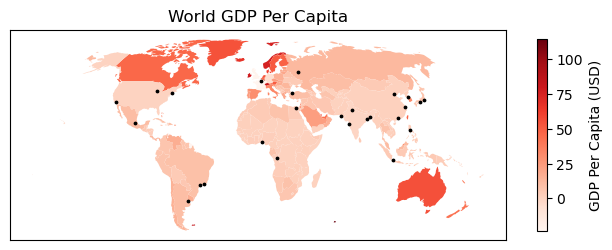

In [6]:
fig, ax = plt.subplots(figsize=(8, 5))

world.plot("gdp_per_cap", ax=ax, cmap="Reds")
cities[cities.pop2020 > 9_000].plot(markersize=3, ax=ax, color="black", label="pop2020")
ax.set_title("World GDP Per Capita")
ax.set_xticks([])
ax.set_yticks([])

# Now I can also work with colormaps in more detail
cbar = fig.colorbar(ax.collections[0], ax=ax, shrink=0.5)
cbar.set_label("GDP Per Capita (USD)")

And yes, we can annotate these cities with their names if we want:

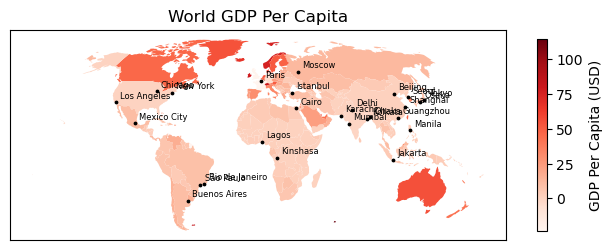

In [7]:
fig, ax = plt.subplots(figsize=(8, 5))

world.plot("gdp_per_cap", ax=ax, cmap="Reds")
cities[cities.pop2020 > 9_000].plot(markersize=3, ax=ax, color="black", label="pop2020")
ax.set_title("World GDP Per Capita")
ax.set_xticks([])
ax.set_yticks([])
cbar = fig.colorbar(ax.collections[0], ax=ax, shrink=0.5)
cbar.set_label("GDP Per Capita (USD)")

for idx, row in cities[cities.pop2020 > 9_000].iterrows():
    ax.annotate(
        row["name"],
        (row.geometry.x, row.geometry.y),  # x and y coordinates
        xytext=(3, 3),  # Distance from point
        textcoords="offset points",  # saying above is distance from point
        fontsize=6,
        ha="left",
        color="black",
    )

## Native Interactive Maps

Being able to make maps with `matplotlib` is great — it offers near infinite control of your figures through a familiar syntax (and one that LLMs know very well). 

But sometimes you want something more! Sometimes you want something interactive, and geopandas has you covered there too.

Geopandas comes bundled with [folium](https://python-visualization.github.io/folium/latest/getting_started.html), a simple library for creating interactive javascript-based maps, complete with basemaps. 

In [12]:
world.explore()